In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statistics as stat
import os
import tqdm
import cv2
import random
from keras.preprocessing.image import load_img
from keras.preprocessing.image import ImageDataGenerator
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, RandomFlip, RandomRotation, RandomZoom, RandomTranslation
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
import sklearn
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from tensorflow import keras
import pickle

In [2]:
!pip install -q -U keras-tuner
import keras_tuner as kt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.1 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Add Data

In [4]:
!pip install opendatasets
import opendatasets as od
od.download('https://www.kaggle.com/datasets/samuelcortinhas/muffin-vs-chihuahua-image-classification',
              '/content/drive/MyDrive/MuffvsChi')
#Download data through direct access of Kaggle's beta API.

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: silvioklenk
Your Kaggle Key: ··········


100%|██████████| 474M/474M [00:25<00:00, 19.2MB/s]


In [5]:
print(f"Dogs in test folder: {len(os.listdir('/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/test/chihuahua'))}")
print(f"Muffins in test folder: {len(os.listdir('/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/test/muffin'))}")
print(f"Dogs in train folder: {len(os.listdir('/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/train/chihuahua'))}")
print(f"Muffins in train folder: {len(os.listdir('/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/train/muffin'))}")

Dogs in test folder: 640
Muffins in test folder: 544
Dogs in train folder: 2559
Muffins in train folder: 2174


## Directories

In [6]:
# Define the main directory
main_dir = '/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification'
train_dir = '/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/train'
test_dir = '/content/drive/MyDrive/MuffvsChi/muffin-vs-chihuahua-image-classification/test'
# Directories
chihuahua_dir_train = os.path.join(main_dir, 'train/', 'chihuahua')
muffin_dir_train = os.path.join(main_dir, 'train/', 'muffin')
chihuahua_dir_test = os.path.join(main_dir, 'test/', 'chihuahua')
muffin_dir_test = os.path.join(main_dir, 'test/', 'muffin')
#
image_path_train = []
labels_train = []
image_path_test = []
labels_test = []

In [7]:
#Iteration for storing
for folder in os.listdir(train_dir):
  for path in os.listdir(train_dir+'/'+folder):
    if folder == 'chihuahua':
      labels_train.append(0)
    else:
      labels_train.append(1)
    image_path_train.append(os.path.join(train_dir, folder, path))
#
for folder in os.listdir(test_dir):
  for path in os.listdir(test_dir+'/'+folder):
    if folder == 'chihuahua':
      labels_test.append(0)
    else:
      labels_test.append(1)
    image_path_test.append(os.path.join(test_dir, folder, path))

In [8]:
#Creating DF_train
df_train_kag = pd.DataFrame()
df_train_kag['image_path'] = image_path_train
df_train_kag['labels'] = labels_train
df_train_kag = df_train_kag.sample(frac=1, random_state=111).reset_index(drop=True) #same number of rows but in a different order(all, 1=100%), and reseting the indeces where the old one gets dropped. Usage in ML settings to ensure each batch is different in training
df_train_kag['labels'] = df_train_kag['labels'].astype('str')
# Creating DF_test
df_test_kag = pd.DataFrame()
df_test_kag['image_path'] = image_path_test
df_test_kag['labels'] = labels_test
df_test_kag = df_test_kag.sample(frac=1, random_state=111).reset_index(drop=True) #same number of rows but in a different order(all, 1=100%), and reseting the indeces where the old one gets dropped. Usage in ML settings to ensure each batch is different in training
df_test_kag['labels'] = df_test_kag['labels'].astype('str')


In [9]:
# combine the two
df_combined = pd.concat([df_test_kag, df_train_kag], ignore_index=True)
df_combined = df_combined.sample(frac=1, random_state = 123).reset_index(drop=True)
df_combined.head()

,image_path,labels
0,/content/drive/MyDrive/MuffvsChi/muffin-vs-chi...,1
1,/content/drive/MyDrive/MuffvsChi/muffin-vs-chi...,0
2,/content/drive/MyDrive/MuffvsChi/muffin-vs-chi...,1
3,/content/drive/MyDrive/MuffvsChi/muffin-vs-chi...,0
4,/content/drive/MyDrive/MuffvsChi/muffin-vs-chi...,1


In [ ]:
# Split for Train & Test Set
df_train_val, df_test = train_test_split(df_combined, test_size=0.2, random_state=123)
# Splitting the df_train_val into Training and Validation set
df_train, df_val = train_test_split(df_train_val, test_size=0.2, random_state=123)


In [ ]:
# Remove images with size 0
df_list = [df_train_val, df_train]
count=0
for df in df_list:
  for path in df['image_path']:
    if os.stat(path).st_size==0:
      os.remove(path)
      count+=1

print(f"Totla number deleted: {count}")

Totla number deleted: 0


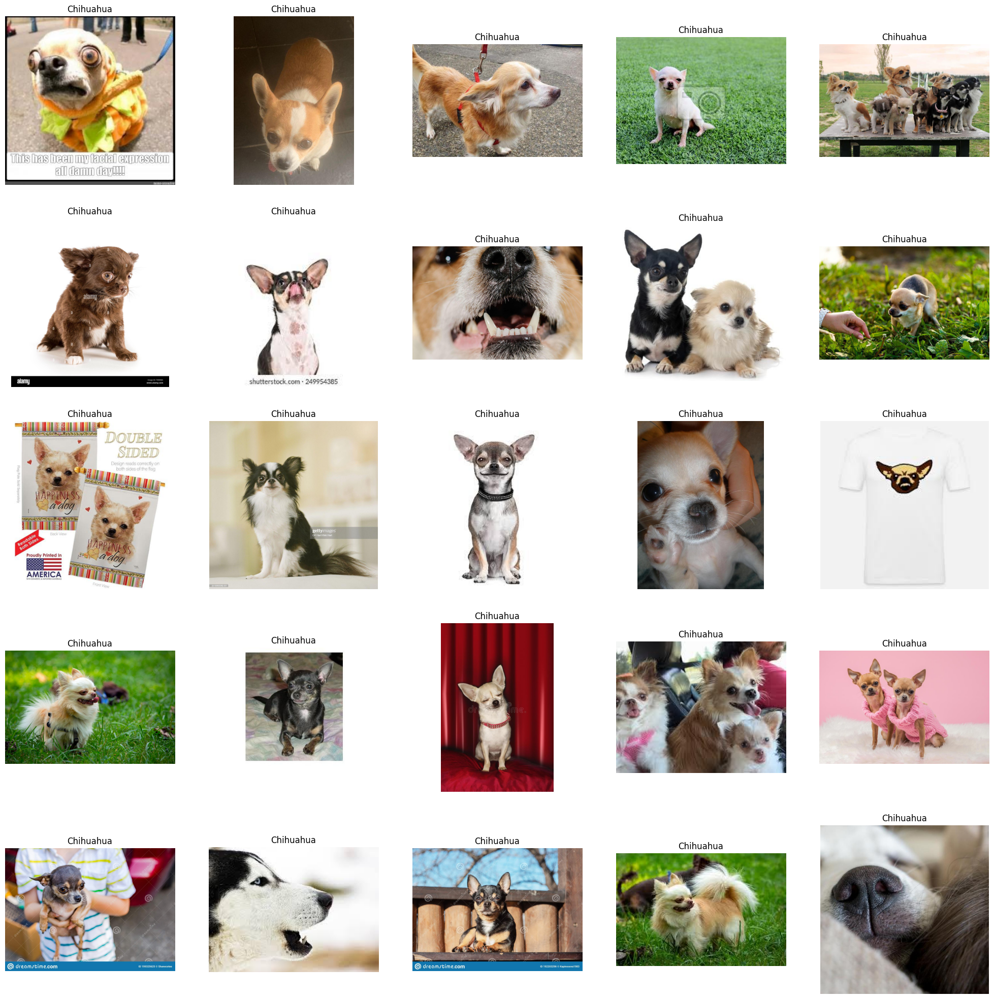

In [ ]:
#Checking what kind of images we have in the different folders
plt.figure(figsize=(25,25))
plt_chi = df_train[df_train['labels']=='0']['image_path']
start = random.randint(0, len(plt_chi))
files = plt_chi[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Chihuahua')
  plt.axis('off')

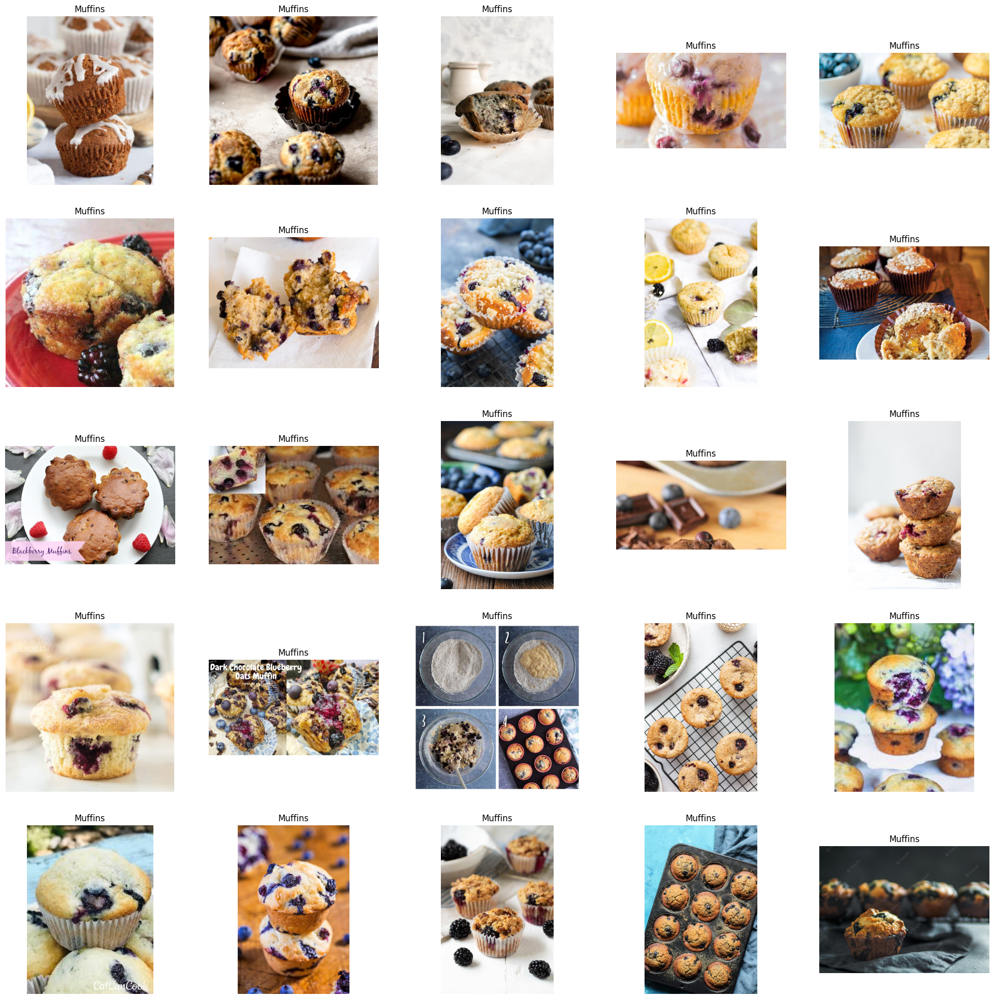

In [ ]:
#same for muffins

plt.figure(figsize=(25,25))
plt_chi = df_train[df_train['labels']=='1']['image_path']
start = random.randint(0, len(plt_chi))
files = plt_chi[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Muffins')
  plt.axis('off')

# Image Generators

## Without data augmentation - Baseline Models

In [10]:
# Image Data Generators
image_data_generator = ImageDataGenerator(rescale=1./255.)
#
img_dim = (128, 128)  # chosen size for all images
batch_size = 64  # optimal batch size for our model

In [ ]:
 #Training data generator with basic augmentation settings
train_val_df_gen = image_data_generator.flow_from_dataframe(df_train_val, directory=None,
                                                            x_col="image_path",y_col="labels",
                                                            batch_size=batch_size, seed=123,
                                                            shuffle=True, class_mode="binary",
                                                            target_size=img_dim)

test_df_gen = image_data_generator.flow_from_dataframe(df_test, directory=None,
                                                            x_col="image_path",y_col="labels",
                                                            batch_size=batch_size, seed = 111,
                                                            shuffle=True, class_mode="binary",
                                                            target_size=img_dim)

train_df_gen = image_data_generator.flow_from_dataframe(df_train, directory=None,
                                                            x_col="image_path",y_col="labels",
                                                            batch_size=batch_size, seed=123,
                                                            shuffle=True, class_mode="binary",
                                                            target_size=img_dim)

val_df_gen = image_data_generator.flow_from_dataframe(df_val, directory=None,
                                                            x_col="image_path",y_col="labels",
                                                            batch_size=batch_size, seed = 111,
                                                            shuffle=True, class_mode="binary",
                                                            target_size=img_dim)

# For validation and test sets, shuffling could be turned off, since the order in which you evaluate your model
# should not affect its performance metrics.

Found 4733 validated image filenames belonging to 2 classes.
Found 1184 validated image filenames belonging to 2 classes.
Found 3786 validated image filenames belonging to 2 classes.
Found 947 validated image filenames belonging to 2 classes.


# Model 1

In [ ]:
def model_1_specif():
  model_1 = Sequential([
        # First layer with 32 filters
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(128, 128, 3)),
        MaxPool2D((2, 2)),
        # Second layer with 64 filters
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        # Flatten layer
        Flatten(),
        # Fully connected layers
        Dense(128, activation='relu'),
        Dense(1, activation='sigmoid')])
  return model_1

In [ ]:
#Compile the first model
model_1 = model_1_specif()
model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Run the training
size_train = train_val_df_gen.n//train_val_df_gen.batch_size
size_val = test_df_gen.n//test_df_gen.batch_size

history_1 = model_1.fit(
    train_val_df_gen,
    steps_per_epoch=size_train,
    validation_data=test_df_gen,
    validation_steps=size_val,
    epochs=50,
    callbacks=[TensorBoard(log_dir="./drive/MyDrive/results/model_1",)])

Epoch 1/50
73/73 [==============================] - 53s 620ms/step - loss: 0.6285 - accuracy: 0.7374 - val_loss: 0.3927 - val_accuracy: 0.8333
Epoch 2/50
73/73 [==============================] - 46s 632ms/step - loss: 0.3290 - accuracy: 0.8653 - val_loss: 0.3355 - val_accuracy: 0.8655
Epoch 3/50
73/73 [==============================] - 45s 615ms/step - loss: 0.2555 - accuracy: 0.8993 - val_loss: 0.3262 - val_accuracy: 0.8724
Epoch 4/50
73/73 [==============================] - 44s 597ms/step - loss: 0.1909 - accuracy: 0.9246 - val_loss: 0.3060 - val_accuracy: 0.8785
Epoch 5/50
73/73 [==============================] - 44s 603ms/step - loss: 0.1369 - accuracy: 0.9488 - val_loss: 0.3528 - val_accuracy: 0.8620
Epoch 6/50
73/73 [==============================] - 43s 592ms/step - loss: 0.0851 - accuracy: 0.9717 - val_loss: 0.3416 - val_accuracy: 0.8785
Epoch 7/50
73/73 [==============================] - 45s 613ms/step - loss: 0.0659 - accuracy: 0.9788 - val_loss: 0.3507 - val_accuracy: 0.8802

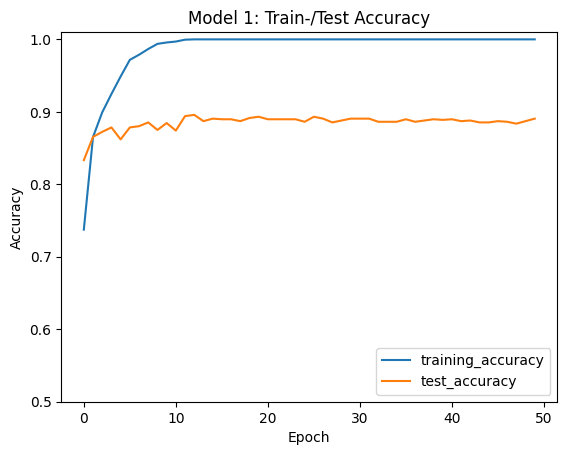

In [ ]:
# Plot the results - Train-/ test Accuracy
plt.plot(history_1.history['accuracy'], label='training_accuracy')
plt.plot(history_1.history['val_accuracy'], label = 'test_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1.01])
plt.legend(loc='lower right')
plt.title("Model 1: Train-/Test Accuracy")
plt.savefig("./drive/MyDrive/results/model_1/model_1_acc_50e")

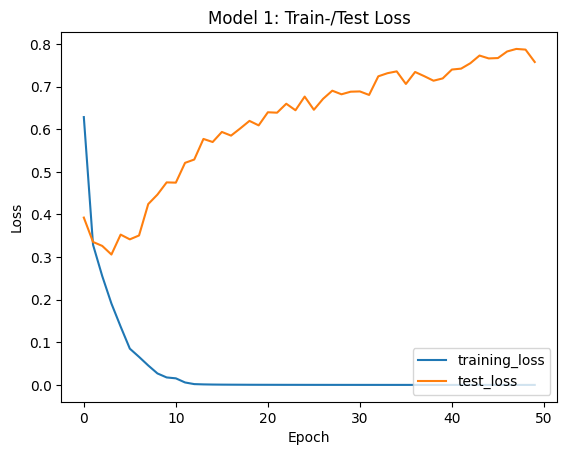

In [ ]:
# Plot the results - Train-/ test Loss
plt.plot(history_1.history['loss'], label='training_loss')
plt.plot(history_1.history['val_loss'], label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.title("Model 1: Train-/Test Loss")
plt.savefig("./drive/MyDrive/results/model_1/model_1_loss_50e")

In [ ]:
test_loss, test_acc = model_1.evaluate(test_df_gen)
print(f"Test Loss: {test_loss} ")
print(f"Test Accuracy: {test_acc})")

19/19 [==============================] - 9s 460ms/step - loss: 0.7821 - accuracy: 0.8868
Test Loss: 0.7820790410041809 
Test Accuracy: 0.8868243098258972)


In [ ]:
# saving the weights
model_1.save_weights('/content/drive/MyDrive/results/model_1/model_1_weights.h5')
# saving full model
model_1.save('/content/drive/MyDrive/results/model_1/model_1_full.h5')
# saving history
with open('/content/drive/MyDrive/results/model_1/history_1.pkl', 'wb') as file_pi:
    pickle.dump(history_1.history, file_pi)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Model 2

In [ ]:
def model_2_specif():
  model_2 = Sequential([
        # First layer with 32 filters
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(128, 128, 3)),
        MaxPool2D((2, 2)),
        # Second layer with 64 filters
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        # Third layer with 128 filters
        Conv2D(128, (3,3), activation='relu', padding='same'),
        MaxPool2D((2,2)),
        # Flatten layer
        Flatten(),
        # Fully connected layers
        Dense(128, activation='relu'),
        Dense(1, activation='sigmoid')])
  return model_2

In [ ]:
#Compile the second model
model_2 = model_2_specif()
model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Run the training
size_train = train_val_df_gen.n//train_val_df_gen.batch_size
size_val = test_df_gen.n//test_df_gen.batch_size

history_2 = model_2.fit(
    train_val_df_gen,
    steps_per_epoch=size_train,
    validation_data=test_df_gen,
    validation_steps=size_val,
    epochs=50,
    callbacks=[TensorBoard(log_dir="./drive/MyDrive/results/model_2",)])

Epoch 1/50
73/73 [==============================] - 45s 577ms/step - loss: 0.6669 - accuracy: 0.6505 - val_loss: 0.5766 - val_accuracy: 0.6806
Epoch 2/50
73/73 [==============================] - 44s 605ms/step - loss: 0.4401 - accuracy: 0.8068 - val_loss: 0.3722 - val_accuracy: 0.8394
Epoch 3/50
73/73 [==============================] - 44s 598ms/step - loss: 0.3683 - accuracy: 0.8398 - val_loss: 0.3480 - val_accuracy: 0.8498
Epoch 4/50
73/73 [==============================] - 43s 588ms/step - loss: 0.3363 - accuracy: 0.8559 - val_loss: 0.3404 - val_accuracy: 0.8585
Epoch 5/50
73/73 [==============================] - 43s 585ms/step - loss: 0.2659 - accuracy: 0.8897 - val_loss: 0.3012 - val_accuracy: 0.8620
Epoch 6/50
73/73 [==============================] - 42s 579ms/step - loss: 0.2247 - accuracy: 0.9092 - val_loss: 0.2996 - val_accuracy: 0.8672
Epoch 7/50
73/73 [==============================] - 41s 568ms/step - loss: 0.1650 - accuracy: 0.9362 - val_loss: 0.2829 - val_accuracy: 0.8785

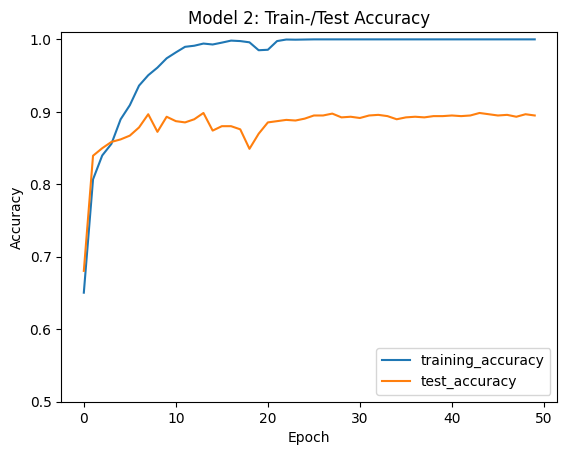

In [ ]:
# Plot the results - Train-/ test Accuracy
plt.plot(history_2.history['accuracy'], label='training_accuracy')
plt.plot(history_2.history['val_accuracy'], label = 'test_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1.01])
plt.legend(loc='lower right')
plt.title("Model 2: Train-/Test Accuracy")
plt.savefig("./drive/MyDrive/results/model_2/model_2_acc_50e")

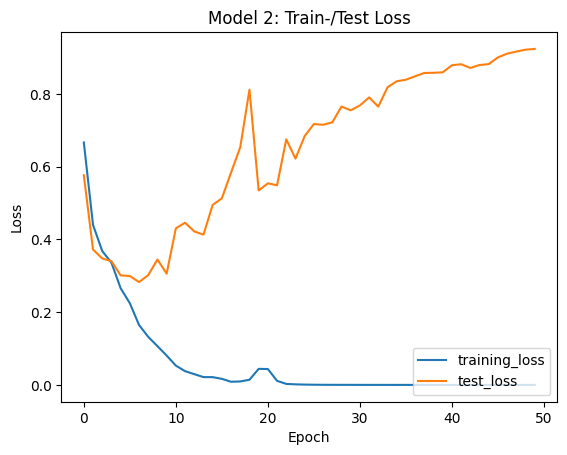

In [ ]:
# Plot the results - Train-/ test Loss
plt.plot(history_2.history['loss'], label='training_loss')
plt.plot(history_2.history['val_loss'], label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.title("Model 2: Train-/Test Loss")
plt.savefig("./drive/MyDrive/results/model_2/model_2_loss_50e")

In [ ]:
test_loss, test_acc = model_2.evaluate(test_df_gen)
print(f"Test Loss: {test_loss} ")
print(f"Test Accuracy: {test_acc})")

19/19 [==============================] - 9s 463ms/step - loss: 0.9185 - accuracy: 0.8961
Test Loss: 0.9184876680374146 
Test Accuracy: 0.8961148858070374)


In [ ]:
# saving the weights
model_2.save_weights('/content/drive/MyDrive/results/model_2/model_2_weights.h5')
# saving full model
model_2.save('/content/drive/MyDrive/results/model_2/model_2_full.h5')
# saving history
with open('/content/drive/MyDrive/results/model_2/history_2.pkl', 'wb') as file_pi:
    pickle.dump(history_2.history, file_pi)

# Model 3 - With Data Augmentation

In [ ]:
def model_3_specif():
  model_3 = Sequential([
        # Define data augmentation layers
        RandomFlip("horizontal", input_shape=(128, 128, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1),
        RandomTranslation(height_factor=0.1, width_factor=0.1, fill_mode='nearest'),
        # First layer with 32 filters
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(128, 128, 3)),
        MaxPool2D((2, 2)),
        Dropout(0.5),
        # Second layer with 64 filters
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        Dropout(0.5),
        # Third layer with 128 filters
        Conv2D(128, (3,3), activation='relu', padding='same'),
        MaxPool2D((2,2)),
        Dropout(0.5),
        # Fourth layer with 256 filters
        Conv2D(256, (3,3), activation='relu', padding='same'),
        MaxPool2D((2,2)),
        Dropout(0.5),
        # Flatten layer
        Flatten(),
        Dropout(0.3),
        # Fully connected layers
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')])
  return model_3

In [ ]:
#Compile the third model
model_3 = model_3_specif()
model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Run the training
size_train = train_val_df_gen.n//train_val_df_gen.batch_size
size_val = test_df_gen.n//test_df_gen.batch_size

history_3 = model_3.fit(
    train_val_df_gen,
    steps_per_epoch=size_train,
    validation_data=test_df_gen,
    validation_steps=size_val,
    epochs=50,
    callbacks=[TensorBoard(log_dir="./drive/MyDrive/results/model_3",)])

Epoch 1/50
73/73 [==============================] - 58s 663ms/step - loss: 0.7547 - accuracy: 0.5327 - val_loss: 0.6905 - val_accuracy: 0.5295
Epoch 2/50
73/73 [==============================] - 50s 688ms/step - loss: 0.6323 - accuracy: 0.6218 - val_loss: 0.5743 - val_accuracy: 0.7734
Epoch 3/50
73/73 [==============================] - 47s 651ms/step - loss: 0.5089 - accuracy: 0.7685 - val_loss: 0.5682 - val_accuracy: 0.7161
Epoch 4/50
73/73 [==============================] - 49s 670ms/step - loss: 0.4573 - accuracy: 0.8053 - val_loss: 0.5295 - val_accuracy: 0.7370
Epoch 5/50
73/73 [==============================] - 48s 658ms/step - loss: 0.4105 - accuracy: 0.8257 - val_loss: 0.4618 - val_accuracy: 0.7734
Epoch 6/50
73/73 [==============================] - 48s 662ms/step - loss: 0.3911 - accuracy: 0.8422 - val_loss: 0.3881 - val_accuracy: 0.8394
Epoch 7/50
73/73 [==============================] - 46s 637ms/step - loss: 0.3518 - accuracy: 0.8554 - val_loss: 0.4506 - val_accuracy: 0.7873

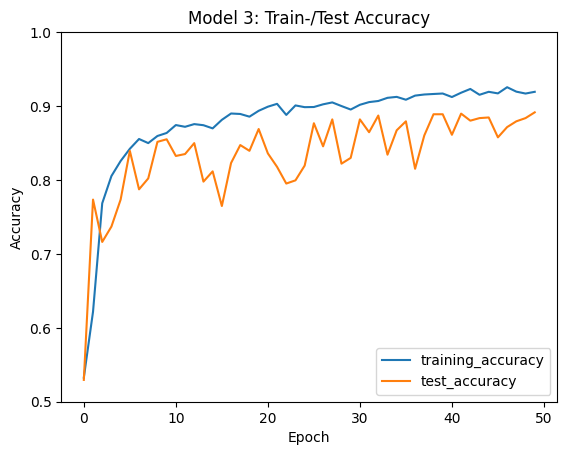

In [ ]:
# Plot the results - Train-/ test Accuracy
plt.plot(history_3.history['accuracy'], label='training_accuracy')
plt.plot(history_3.history['val_accuracy'], label = 'test_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.title("Model 3: Train-/Test Accuracy")
plt.savefig("./drive/MyDrive/results/model_3/model_3_acc_50e")

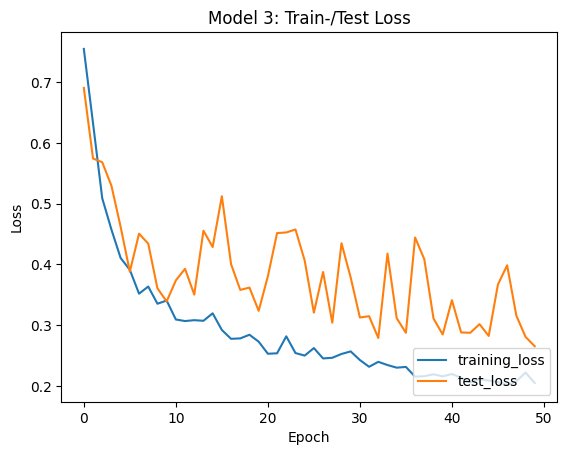

In [ ]:
# Plot the results - Train-/ test Loss
plt.plot(history_3.history['loss'], label='training_loss')
plt.plot(history_3.history['val_loss'], label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.title("Model 3: Train-/Test Loss")
plt.savefig("./drive/MyDrive/results/model_3/model_3_loss_50e")

In [ ]:
test_loss, test_acc = model_3.evaluate(test_df_gen)
print(f"Test Loss: {test_loss} ")
print(f"Test Accuracy: {test_acc})")

19/19 [==============================] - 9s 475ms/step - loss: 0.2690 - accuracy: 0.8910
Test Loss: 0.26901891827583313 
Test Accuracy: 0.8910472989082336)


In [ ]:
# saving the weights
model_3.save_weights('/content/drive/MyDrive/results/model_3/model_3_weights.h5')
# saving full model
model_3.save('/content/drive/MyDrive/results/model_3/model_3_full.h5')
# saving history
with open('/content/drive/MyDrive/results/model_3/history_3.pkl', 'wb') as file_pi:
    pickle.dump(history_3.history, file_pi)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Model 4 with Hyperparameter tuning

In [11]:
def model_4_specif(tuning_params):
    model_4 = Sequential([
        # Define data augmentation layers
        RandomFlip("horizontal", input_shape=(128, 128, 3)),
        RandomRotation(tuning_params.Float('rotation_factor', min_value=0.01, max_value=0.1, step=0.01)),
        RandomZoom(tuning_params.Float('zoom_factor', min_value=0.01, max_value=0.1, step=0.01)),
        RandomTranslation(height_factor=tuning_params.Float('translation_height_factor', min_value=0.01, max_value=0.1, step=0.01),
                          width_factor=tuning_params.Float('translation_width_factor', min_value=0.01, max_value=0.1, step=0.01),
                          fill_mode='nearest'),
        # First with 32 filters
        Conv2D(tuning_params.Int('conv_1_units', min_value=32, max_value=64, step=16), (3, 3), activation='relu', padding="same"),
        MaxPool2D((2, 2)),
        Dropout(tuning_params.Float('drop_conv_1', min_value=0.3, max_value=0.5, step=0.1)),
        # Second with 64 filters
        Conv2D(tuning_params.Int('conv_2_units', min_value=64, max_value=128, step=32), (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        Dropout(tuning_params.Float('drop_conv_2', min_value=0.3, max_value=0.5, step=0.1)),
        # Third with 128 filters
        Conv2D(tuning_params.Int('conv_3_units', min_value=128, max_value=256, step=64), (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        Dropout(tuning_params.Float('drop_conv_3', min_value=0.3, max_value=0.5, step=0.1)),
        # Forth with 256 filters
        Conv2D(tuning_params.Int('conv_4_units', min_value=256, max_value=512, step=128), (3, 3), activation='relu', padding='same'),
        MaxPool2D((2, 2)),
        Dropout(tuning_params.Float('drop_conv_4', min_value=0.3, max_value=0.5, step=0.1)),
        # Flatten
        Flatten(),
        Dropout(tuning_params.Float('drop_flat', min_value=0.3, max_value=0.5, step=0.1)),
        # First fully connected layer
        Dense(tuning_params.Int('dense_units_1', min_value=64, max_value=256, step=64), activation='relu'),
        Dropout(tuning_params.Float('drop_dense_1', min_value=0.3, max_value=0.5, step=0.1)),
        # Second fully connected layer
        Dense(tuning_params.Int('dense_units_2', min_value=64, max_value=256, step=64), activation='relu'),
        Dropout(tuning_params.Float('drop_dense_2', min_value=0.3, max_value=0.5, step=0.1)),
        # Last fully connected layer
        Dense(1, activation='sigmoid')])

    #Compile the third model
    model_4.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model_4


In [12]:
# Tuner
tuner = kt.BayesianOptimization(model_4_specif,
                                objective="val_accuracy",
                                max_trials=17,
                                directory="./drive/MyDrive/chi_muf_log_tun",
                                project_name="chi_muf_class",
                                overwrite=False)

Reloading Tuner from ./drive/MyDrive/chi_muf_log_tun/chi_muf_class/tuner0.json


In [13]:
# Summary of the search space
tuner.search_space_summary()

Search space summary
Default search space size: 17
rotation_factor (Float)
{'default': 0.01, 'conditions': [], 'min_value': 0.01, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
zoom_factor (Float)
{'default': 0.01, 'conditions': [], 'min_value': 0.01, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
translation_height_factor (Float)
{'default': 0.01, 'conditions': [], 'min_value': 0.01, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
translation_width_factor (Float)
{'default': 0.01, 'conditions': [], 'min_value': 0.01, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
conv_1_units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 64, 'step': 16, 'sampling': 'linear'}
drop_conv_1 (Float)
{'default': 0.3, 'conditions': [], 'min_value': 0.3, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
conv_2_units (Int)
{'default': None, 'conditions': [], 'min_value': 64, 'max_value': 128, 'step': 32, 'sampling': 'linear'}
drop_conv_2 (Float)
{'default

In [ ]:
# Start the search!
tuner.search(train_df_gen, batch_size=64, epochs=100, validation_data=val_df_gen,
             callbacks=[EarlyStopping(monitor="val_loss", patience=5)])

Trial 17 Complete [00h 08m 15s]
val_accuracy: 0.8753960132598877

Best val_accuracy So Far: 0.9239704608917236
Total elapsed time: 05h 59m 15s


In [14]:
# Get the optimal hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
best_hyperparameters.values

{'rotation_factor': 0.06999999999999999,
 'zoom_factor': 0.05,
 'translation_height_factor': 0.060000000000000005,
 'translation_width_factor': 0.02,
 'conv_1_units': 32,
 'drop_conv_1': 0.4,
 'conv_2_units': 64,
 'drop_conv_2': 0.4,
 'conv_3_units': 192,
 'drop_conv_3': 0.3,
 'conv_4_units': 384,
 'drop_conv_4': 0.3,
 'drop_flat': 0.5,
 'dense_units_1': 192,
 'drop_dense_1': 0.4,
 'dense_units_2': 192,
 'drop_dense_2': 0.4}

In [ ]:
hyper_model = tuner.hypermodel.build(best_hyperparameters)
history_4 = hyper_model.fit(train_df_gen,
                           epochs=50,
                           validation_data = val_df_gen,
                           callbacks = [TensorBoard(log_dir="./drive/MyDrive/results/model_4",)])

best_epoch = history_4.history['val_accuracy'].index(max(history_4.history['val_accuracy'])) + 1
print(f"The best epoch is {best_epoch}")


Epoch 1/50
60/60 [==============================] - 41s 635ms/step - loss: 0.7019 - accuracy: 0.5365 - val_loss: 0.6831 - val_accuracy: 0.5576
Epoch 2/50
60/60 [==============================] - 40s 671ms/step - loss: 0.5679 - accuracy: 0.7100 - val_loss: 0.4855 - val_accuracy: 0.8120
Epoch 3/50
60/60 [==============================] - 40s 674ms/step - loss: 0.4673 - accuracy: 0.7956 - val_loss: 0.5526 - val_accuracy: 0.7086
Epoch 4/50
60/60 [==============================] - 36s 605ms/step - loss: 0.4044 - accuracy: 0.8317 - val_loss: 0.4935 - val_accuracy: 0.7751
Epoch 5/50
60/60 [==============================] - 39s 658ms/step - loss: 0.4184 - accuracy: 0.8294 - val_loss: 0.4310 - val_accuracy: 0.7920
Epoch 6/50
60/60 [==============================] - 39s 652ms/step - loss: 0.3404 - accuracy: 0.8634 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 7/50
60/60 [==============================] - 35s 587ms/step - loss: 0.3265 - accuracy: 0.8735 - val_loss: 0.3453 - val_accuracy: 0.8617

In [ ]:
# saving the weights
hyper_model.save_weights('/content/drive/MyDrive/results/model_4/model_4_weights.h5')
# saving full model
hyper_model.save('/content/drive/MyDrive/results/model_4/model_4_full.h5')
# saving history
with open('/content/drive/MyDrive/results/model_4/history_4.pkl', 'wb') as file_pi:
    pickle.dump(history_4.history, file_pi)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Re-instantiate the model w/ optimal hyperparameters
hyper_model_1 = tuner.hypermodel.build(best_hyperparameters)

# Retrain the model on the optimal number of epochs
history_5 = hyper_model_1.fit(train_val_df_gen, epochs = int(best_epoch*1.1), validation_data = test_df_gen,
                            callbacks= [TensorBoard(log_dir="./drive/MyDrive/results/model_5",)])


Epoch 1/39
74/74 [==============================] - 49s 621ms/step - loss: 0.7154 - accuracy: 0.5318 - val_loss: 0.6916 - val_accuracy: 0.5304
Epoch 2/39
74/74 [==============================] - 45s 605ms/step - loss: 0.6748 - accuracy: 0.5827 - val_loss: 0.5834 - val_accuracy: 0.7829
Epoch 3/39
74/74 [==============================] - 44s 599ms/step - loss: 0.5469 - accuracy: 0.7410 - val_loss: 0.4339 - val_accuracy: 0.8218
Epoch 4/39
74/74 [==============================] - 45s 607ms/step - loss: 0.4155 - accuracy: 0.8286 - val_loss: 0.3641 - val_accuracy: 0.8438
Epoch 5/39
74/74 [==============================] - 44s 590ms/step - loss: 0.3901 - accuracy: 0.8398 - val_loss: 0.3169 - val_accuracy: 0.8682
Epoch 6/39
74/74 [==============================] - 45s 603ms/step - loss: 0.3338 - accuracy: 0.8709 - val_loss: 0.2999 - val_accuracy: 0.8809
Epoch 7/39
74/74 [==============================] - 44s 594ms/step - loss: 0.3444 - accuracy: 0.8578 - val_loss: 0.2909 - val_accuracy: 0.8792

In [ ]:
# saving the weights
hyper_model_1.save_weights('/content/drive/MyDrive/results/model_5/model_5_weights.h5')
# saving full model
hyper_model_1.save('/content/drive/MyDrive/results/model_5/model_5_full.h5')
# saving history
with open('/content/drive/MyDrive/results/model_5/history_5.pkl', 'wb') as file_pi:
    pickle.dump(history_5.history, file_pi)

In [ ]:
hyper_model_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip_4 (RandomFlip)  (None, 128, 128, 3)       0         
                                                                 
 random_rotation_4 (RandomR  (None, 128, 128, 3)       0         
 otation)                                                        
                                                                 
 random_zoom_4 (RandomZoom)  (None, 128, 128, 3)       0         
                                                                 
 random_translation_4 (Rand  (None, 128, 128, 3)       0         
 omTranslation)                                                  
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 64, 64, 32)       

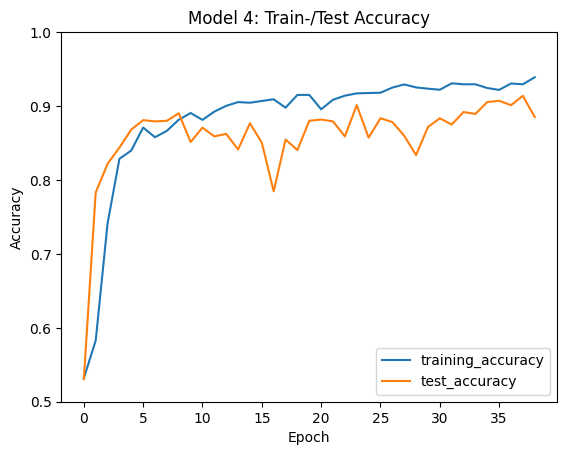

In [ ]:
# Plot the results - Train-/ test Accuracy
plt.plot(history_5.history['accuracy'], label='training_accuracy')
plt.plot(history_5.history['val_accuracy'], label = 'test_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.title("Model 4: Train-/Test Accuracy")
plt.savefig("./drive/MyDrive/results/model_5/model_5_acc_50e")

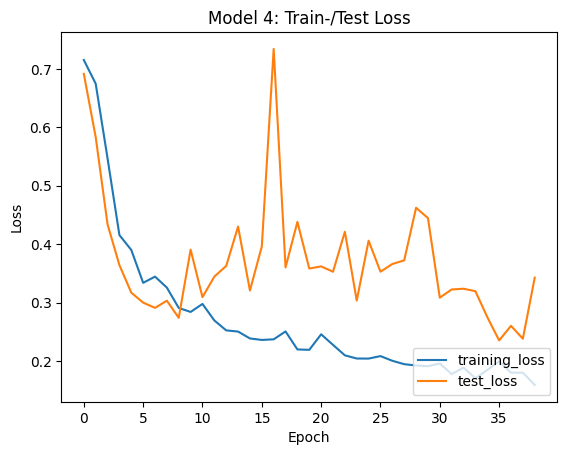

In [ ]:
# Plot the results - Train-/ test Loss
plt.plot(history_5.history['loss'], label='training_loss')
plt.plot(history_5.history['val_loss'], label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='lower right')
plt.title("Model 4: Train-/Test Loss")
plt.savefig("./drive/MyDrive/results/model_5/model_5_loss_50e")

In [ ]:
test_loss, test_acc = hyper_model.evaluate(test_df_gen)
print(f"Test Loss: {test_loss} ")
print(f"Test Accuracy: {test_acc})")

19/19 [==============================] - 8s 439ms/step - loss: 0.2109 - accuracy: 0.9139
Test Loss: 0.21094480156898499 
Test Accuracy: 0.9138513803482056)


# CV

In [15]:
cv_outer = KFold(n_splits = 5, shuffle = True, random_state = 13)
cv_inner = KFold(n_splits = 5, shuffle = True, random_state = 12)
fold = 1
img_dim = (128,128)
TEST_ACCURACY = []
TEST_LOSS = []
for val_train_index, test_index in cv_outer.split(df_combined):
    # FIRST SPLIT: train+validation set and test set
    val_train, df_test = df_combined.iloc[val_train_index], df_combined.iloc[test_index]
    print("\n")
    print("======================================================================")
    print(f"Cross validation split n. --> {fold}")

    train, validation = next(cv_inner.split(val_train))

    # SECOND SPLIT: train set and validation set
    df_train, df_validation = val_train.iloc[train], val_train.iloc[validation]
    print("training set has length " + str(len(train)))
    print("validation set has length " + str(len(validation)))
    print("test set has length " + str(len(test_index)))
    print("---------------------------------------------------------------------")

    # GENERATORS
    train_generator = image_data_generator.flow_from_dataframe(df_train,
                                                                    directory=None,
                                                                    x_col="image_path",y_col="labels",
                                                                    batch_size=64, seed=123,
                                                                    shuffle=True, class_mode="binary",
                                                                    target_size=img_dim)

    val_generator  = image_data_generator.flow_from_dataframe(df_validation,
                                                                     directory=None,
                                                                     x_col="image_path",y_col="labels",
                                                                     batch_size=64, seed=123,
                                                                     shuffle=True, class_mode="binary",
                                                                     target_size=img_dim)

    test_generator = image_data_generator.flow_from_dataframe(df_test,
                                                                   directory=None,
                                                                   x_col="image_path",y_col="labels",
                                                                   batch_size=64, seed=123,
                                                                   shuffle=True, class_mode="binary",
                                                                   target_size=img_dim)


    # CREATE NEW MODEL
    model = model_4_specif(best_hyperparameters)

    # COMPILE NEW MODEL
    model.compile(loss='binary_crossentropy',optimizer="adam", metrics=['accuracy'])


    log_dir = f"./drive/MyDrive/results/model_4_cv/fold_{fold}"

    # Train the model
    history = model.fit(train_generator,
                        epochs=50,
                        steps_per_epoch=train_generator.n // batch_size,
                        validation_data=val_generator,
                        validation_steps=val_generator.n // batch_size,
                        callbacks=[TensorBoard(log_dir=log_dir,)])

    with open(f'./drive/MyDrive/results/trainHistoryDict_split{fold}', 'wb') as file_pi:
        pickle.dump(history.history, file_pi)

    # EVALUATE RESULTS
    print("---------------------------------------------------------------------")
    print("Evaluating the results....")
    results = model.evaluate(test_generator)
    results = dict(zip(model.metrics_names,results))

    TEST_ACCURACY.append(results['accuracy'])
    TEST_LOSS.append(results['loss'])

    fold += 1
    tf.keras.backend.clear_session()



Cross validation split n. --> 1
training set has length 3786
validation set has length 947
test set has length 1184
---------------------------------------------------------------------
Found 3786 validated image filenames belonging to 2 classes.
Found 947 validated image filenames belonging to 2 classes.
Found 1184 validated image filenames belonging to 2 classes.
Epoch 1/50
59/59 [==============================] - 55s 720ms/step - loss: 0.7269 - accuracy: 0.5344 - val_loss: 0.6913 - val_accuracy: 0.5324
Epoch 2/50
59/59 [==============================] - 39s 665ms/step - loss: 0.6444 - accuracy: 0.6112 - val_loss: 0.6272 - val_accuracy: 0.7511
Epoch 3/50
59/59 [==============================] - 45s 761ms/step - loss: 0.5393 - accuracy: 0.7423 - val_loss: 0.5233 - val_accuracy: 0.8147
Epoch 4/50
59/59 [==============================] - 43s 737ms/step - loss: 0.4601 - accuracy: 0.8001 - val_loss: 0.4653 - val_accuracy: 0.8092
Epoch 5/50
59/59 [==============================] - 39s 66

In [16]:
print(f"Test Accuracy_- CV Estimate: {stat.mean(TEST_ACCURACY)}")
print(f"Test Loss - CV Estimate: {stat.mean(TEST_LOSS)}")

Test Accuracy_- CV Estimate: 0.8776424527168274
Test Loss - CV Estimate: 0.31149573922157286


In [17]:
loss_list = []
accuracy_list = []
val_loss_list = []
val_accuracy_list = []
for i in range(1,6):
  with open(f'./drive/MyDrive/results/trainHistoryDict_split{i}', "rb") as input_file:
    e = pickle.load(input_file)
    loss_list.append(e["loss"])
    accuracy_list.append((e["accuracy"]))
    val_loss_list.append((e["val_loss"]))
    val_accuracy_list.append((e["val_accuracy"]))

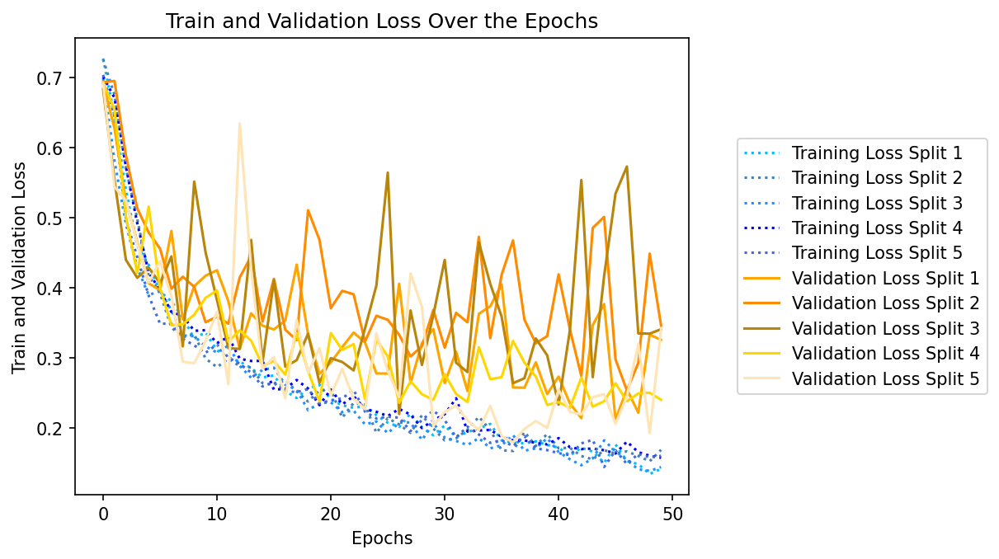

In [19]:
color_dict = {1:"deepskyblue", 2: "steelblue", 3:"dodgerblue", 4: "blue", 5: "royalblue"}
color_dict_2 = {1:"orange", 2: "darkorange", 3:"darkgoldenrod", 4: "gold", 5: "moccasin"}
fig = plt.figure(dpi=150)
plt.xlabel("Epochs")
plt.ylabel("Train and Validation Loss")
plt.title("Train and Validation Loss Over the Epochs")
count=1
for i in loss_list:
  plt.plot(i, label = f"Training Loss Split {count}", linestyle='dotted', color = color_dict[count])
  count+=1
count=1
for i in val_loss_list:
  plt.plot(i, label = f"Validation Loss Split {count}", linestyle='solid', color = color_dict_2[count])
  count+=1

plt.legend(loc='center right', bbox_to_anchor=(1.5, 0.5), fancybox=True)
plt.savefig("./drive/MyDrive/results/cv_Output")

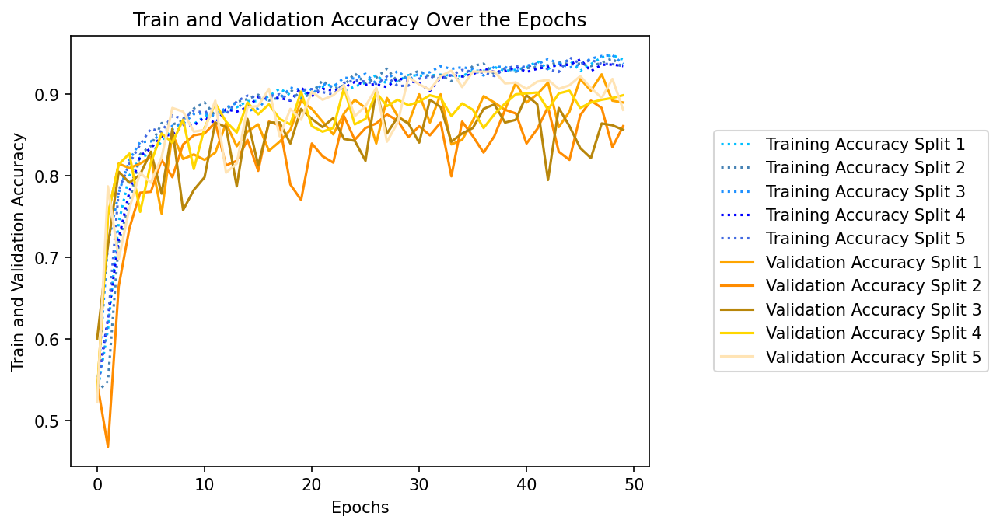

In [20]:
fig = plt.figure(dpi=150)
plt.xlabel("Epochs")
plt.ylabel("Train and Validation Accuracy")
plt.title("Train and Validation Accuracy Over the Epochs")
count=1
for i in accuracy_list:
  plt.plot(i, label = f"Training Accuracy Split {count}", linestyle='dotted', color = color_dict[count])
  count+=1
count=1
for i in val_accuracy_list:
  plt.plot(i, label = f"Validation Accuracy Split {count}", linestyle='solid', color = color_dict_2[count])
  count+=1

plt.legend(loc='center right', bbox_to_anchor=(1.6, 0.5), fancybox=True)
plt.savefig("./drive/MyDrive/results/cv_output2")